# Self-Driving Car Engineer Nanodegree

## Project: Advanced Lane Finding


In the first project of this term, I implemented a lane detection pipeline based on the Canny Transform and the Hogh Lines. In this project the idea is to implement a more robust solution for lane detection. The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In the following is shown how the previous points were addressed

## 1. Camera Calibration and Distortion Coefficients

The first step of the pipeline for this project is to calibrate the camera and finding the distortion coefficients in order to get undistorted images that can be properly processed to precisely detect lanes 

In [505]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import glob
%matplotlib inline

from importlib import reload
import utilities; reload(utilities)
from utilities import *

### Identifying Chessboard Corners

The following is an example of one of the calibration images

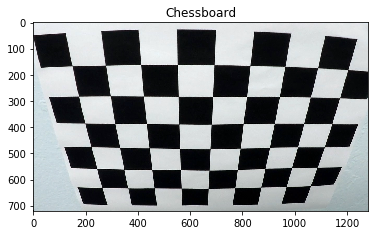

In [491]:
cal_img_example = cv2.imread("camera_cal/calibration2.jpg")
show_image(cal_img_example, "Chessboard")

From the previous image we can observe that the number of corner in the x axis is 9, while in the y axis is 6

In [492]:
nx = 9
ny = 6

The corners are highlighted in the following image

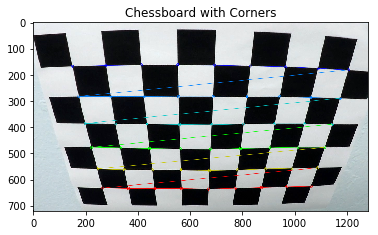

In [493]:
# Convert to grayscale
cal_img_gray = cv2.cvtColor(cal_img_example, cv2.COLOR_BGR2GRAY)

# Find the chessboard corners
ret, corners = cv2.findChessboardCorners(cal_img_gray, (nx, ny), None)

# Draw and display the corners
cv2.drawChessboardCorners(cal_img_example, (nx, ny), corners, ret)
show_image(cal_img_example, "Chessboard with Corners", file = "chessboard_corners")

### Identifying Image and Object Points

For each of the calibration images the following function identifies the object points (3D points in real world space) and images points (2D points in  image plane)

In [494]:
def get_img_obj_points():
    """
    Identifies both the image and object points
    """
    
    # Arrays to store the image and object points
    imgpoints = []
    objpoints = []
    
    # Prepare object points 
    objp = np.zeros((nx * ny, 3), np.float32)
    objp[:, :2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)

    # Iterate over all calibration images
    images = glob.glob("camera_cal/calibration*.jpg")
    for image in images:
        cal_img = mpimg.imread(image)
        gray = cv2.cvtColor(cal_img, cv2.COLOR_BGR2GRAY)
        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
        if ret == True:
            imgpoints.append(corners)
            objpoints.append(objp)
            
    return objpoints, imgpoints

In [495]:
# Get the image and object points
objpoints, imgpoints = get_img_obj_points()

### Camera Calibration Matrix

The following function finds the camera calibration matrix for a given image and also undistorts the image

In [496]:
def undistort_image(img):
    """
    Undistorts a given image based on cv2.calibrateCamera() and cv2.undistort()
    """    
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

    undistort = cv2.undistort(img, mtx, dist, None, mtx)
    
    return undistort

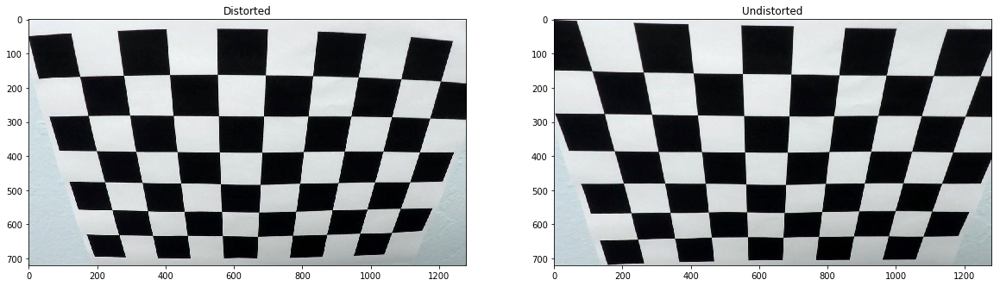

In [497]:
# Test camera calibration and distortion correction
cal_img_example = cv2.imread("camera_cal/calibration2.jpg")
cal_img_undist = undistort_image(cal_img_example)
show_images_side_by_side(cal_img_example, cal_img_undist, title1 = "Distorted", title2 = "Undistorted", file = "undistorted_chessboard")

### 2. Applying Distortion Correction to the Given Test Images

The following test images show the camera distortion correction in action

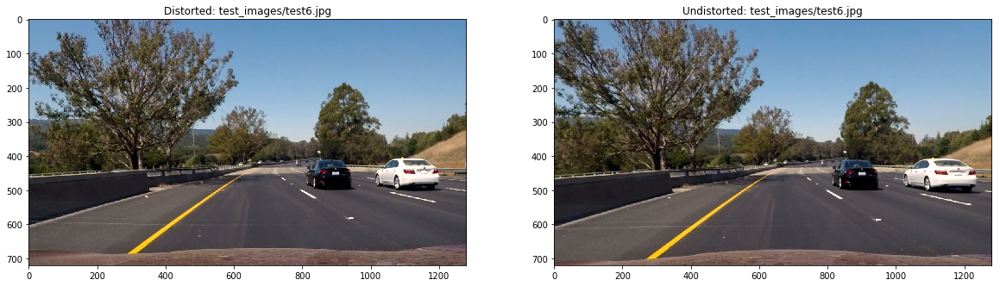

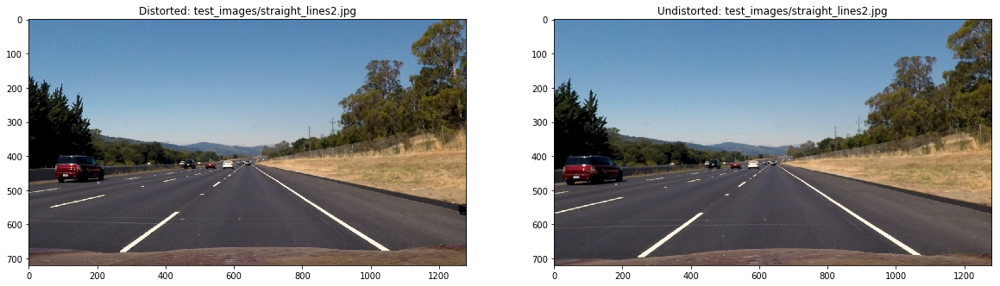

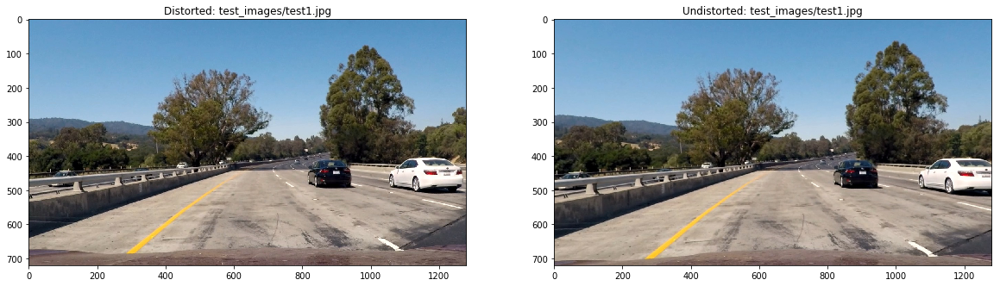

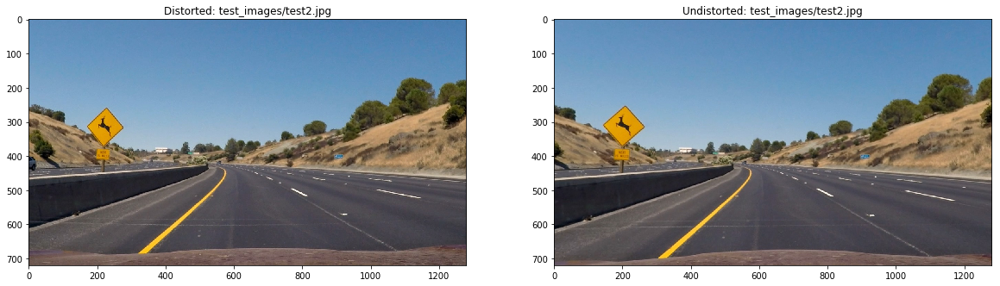

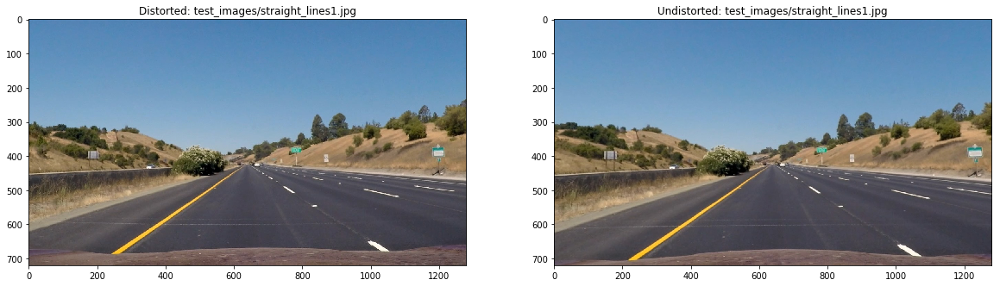

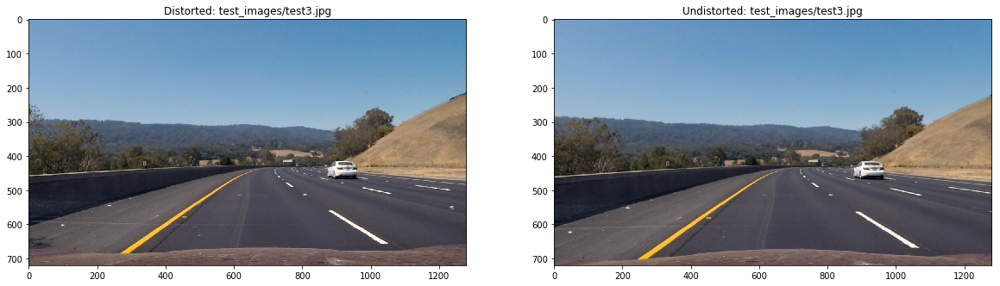

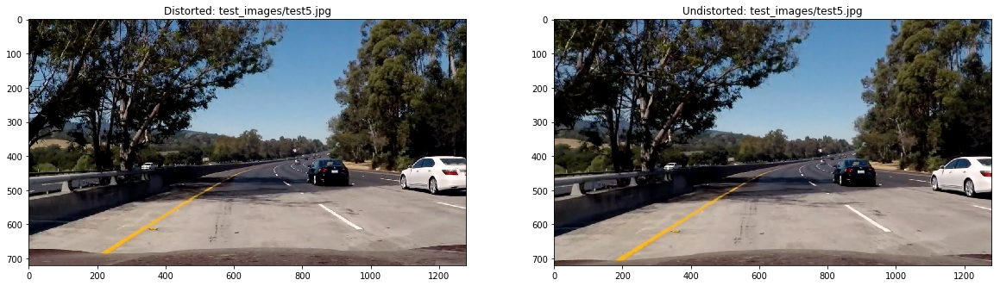

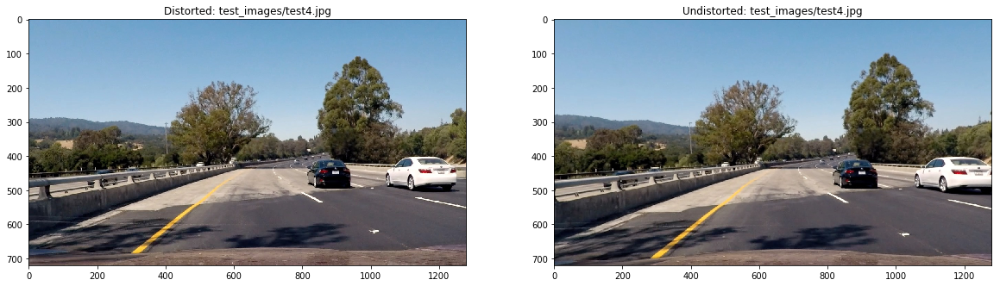

In [498]:
# Test distortion correction
images = glob.glob("test_images/*.jpg")
for image_path in images:
    input_image = mpimg.imread(image_path);
    undist_image = undistort_image(input_image)
    show_images_side_by_side(input_image, undist_image, title1="Distorted: " + image_path, title2="Undistorted: " + image_path, file = "undistorted_test_image")

### 3. Gradient and Color Thresholding

The following function combines color and gradient thresholding to achieve a more robust edge detection for lane identification

In [398]:
def increase_brightness(img, value=30):
    """
    This function to increase brightness was taken from the following source:
    
    https://stackoverflow.com/questions/32609098/how-to-fast-change-image-brightness-with-python-opencv
    """
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv)

    lim = 255 - value
    v[v > lim] = 255
    v[v <= lim] += value

    final_hsv = cv2.merge((h, s, v))
    img = cv2.cvtColor(final_hsv, cv2.COLOR_HSV2BGR)
    
    return img

def color_gradient_thres(img, sobel_kernel = 3): 
    # Increase brightness to help with the detection of while lines
    improved_img = increase_brightness(img, value = 15)
        
    # Detect yellow lines
    hsv = cv2.cvtColor(improved_img, cv2.COLOR_RGB2HSV)
    yellow_min = np.array([20, 60, 60],np.uint8)
    yellow_max = np.array([95, 255, 255],np.uint8)
    yellow_binary = cv2.inRange(hsv, yellow_min,  yellow_max);
    
    # Detect white lines
    white_min = np.array([0, 0, 208],np.uint8)
    white_max = np.array([255, 25, 255],np.uint8)
    white_binary = cv2.inRange(hsv, white_min,  white_max); 
    
    # Combine yellow and white binary images
    color_binary = cv2.bitwise_or(yellow_binary, white_binary)
    
    # Grayscale image
    gray = cv2.cvtColor(improved_img, cv2.COLOR_RGB2GRAY)
    
    # Apply Sobel X and Y
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel) # Take the derivative in x
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sx_thresh = (0, 100)
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold direction
    dir_thresh = (np.pi*2/3, np.pi/2)
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    dir_binary = np.zeros_like(absgraddir)
    dir_binary[(absgraddir >= dir_thresh[0]) & (absgraddir <= dir_thresh[1])] = 1
    
    # Threshold magnitude
    mag_thresh = mag_thresh=(30, 150)
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    mag_binary = np.zeros_like(gradmag)
    mag_binary[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    
    # Gradient binary image
    gradient_binary = np.zeros_like(sxbinary)
    gradient_binary[(sxbinary == 1) | ((dir_binary == 1) & (mag_binary == 1))] = 1
    
    # Final binary image that combines color and gradient thresholds
    combined_binary = cv2.bitwise_and(color_binary, gradient_binary)

    return combined_binary

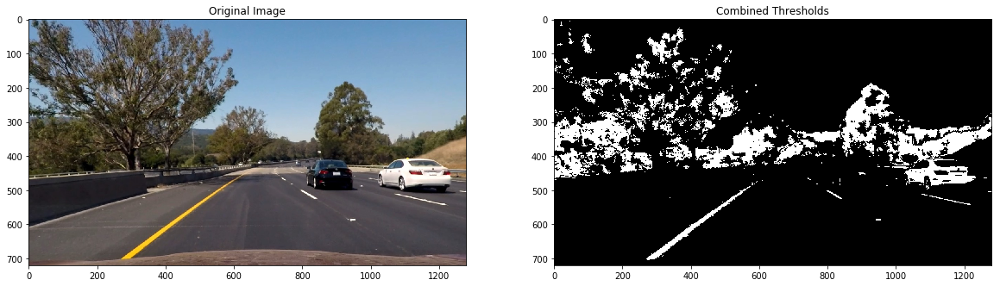

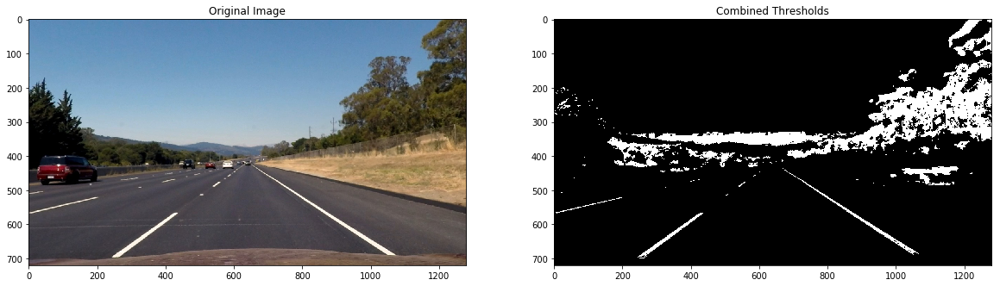

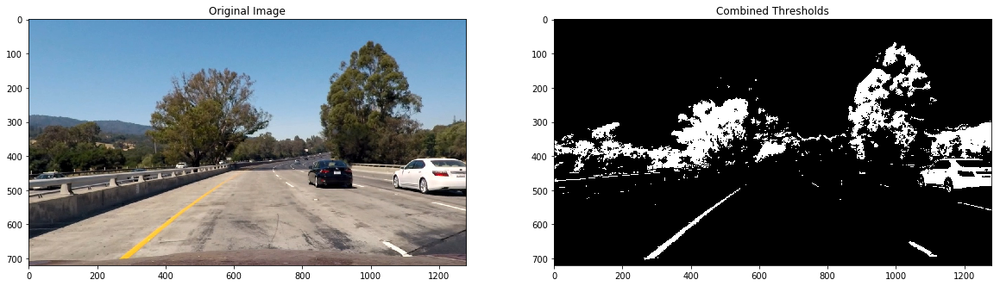

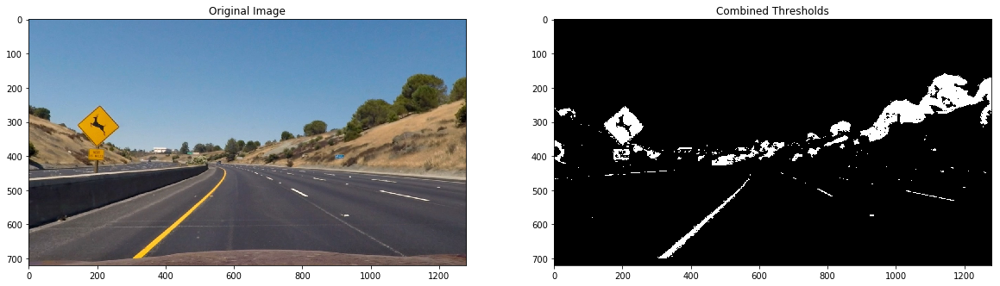

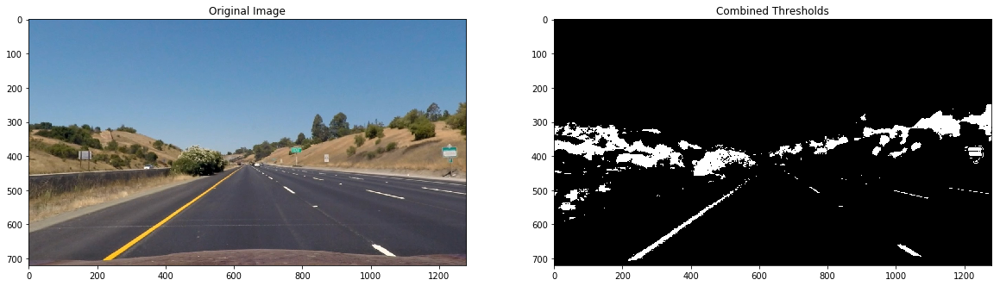

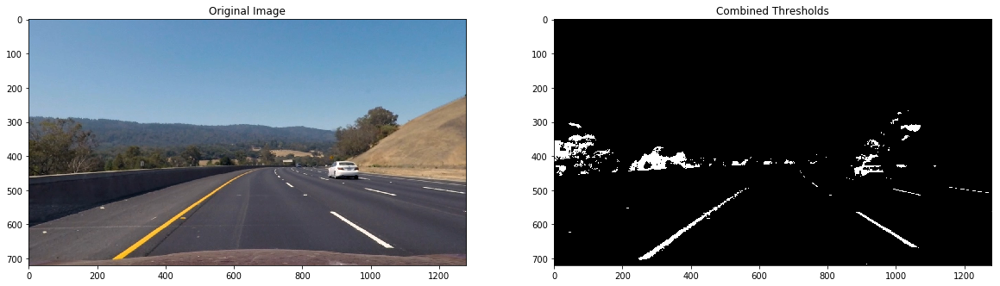

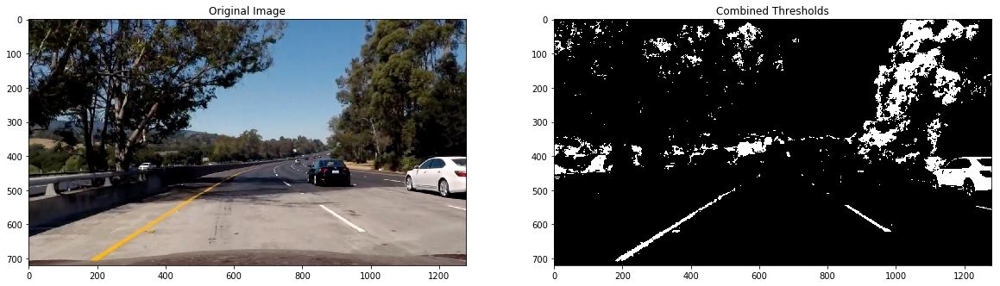

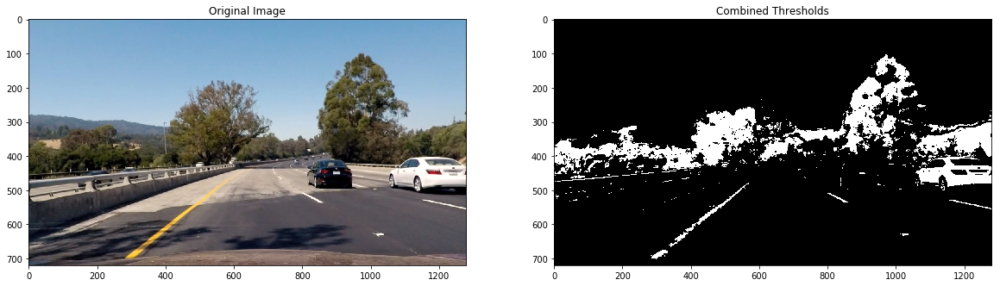

In [500]:
# Test color and gradient thresholding
images = glob.glob("test_images/*.jpg")
for image_path in images:
    input_img = mpimg.imread(image_path);
    undistor_img = undistort_image(input_img)
    combined_binary = color_gradient_thres(undistor_img)
    show_images_side_by_side(undistor_img, combined_binary, "Original Image", "Combined Thresholds", file = "binary_image")

### 4. Perspective Transform

The following function performs a perspective transformation to get a birds eye view of the road. This is achieved by using the OpenCV functions cv2.getPerspectiveTransform() and cv2.warpPerspective()

In [366]:
def perspective_transform(img):
    
    # Image dimensions
    img_size = (img.shape[1], img.shape[0])
    width = img.shape[1]
    height = img.shape[0]
    
    # Define 4 source points
    v1 = (10, height)
    v2 = (width/2 - 95, height * 0.645)
    v3 = (width/2 + 95, height * 0.645)
    v4 = (width - 10, height)
    src = np.float32([v1, v2, v3, v4])
    
    # Define 4 destination points
    offset = 100
    dst = np.float32([[offset, height],
                      [offset, 0],
                      [width-offset, 0],
                      [width-offset, height]])
    
    # Get the transform matrix M
    M = cv2.getPerspectiveTransform(src, dst)
    
    # Get the inverserse transform matrix Minv
    Minv = cv2.getPerspectiveTransform(dst, src)

    # Warp the image to a top-down view
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    
    return warped, Minv

In [ ]:
# Test perspective transform
images = glob.glob("test_images/*.jpg")
for idx, image_path in enumerate(images):
    input_img = mpimg.imread(image_path);

    # Undistort image 
    undistor_img = undistort_image(input_img)
        
    # Apply color and gradient thresholding
    combined_binary = color_gradient_thres(undistor_img)

    # Apply perspective transform
    birds_eye_input, _ = perspective_transform(input_img)
    birds_eye_threshold, _ = perspective_transform(combined_binary)

    # Draw area in the input image to be transformed
    width = input_img.shape[1]
    height = input_img.shape[0]
    v1 = (10, height)
    v2 = (width/2 - 95, height * 0.645)
    v3 = (width/2 + 95, height * 0.645)
    v4 = (width - 10, height)
    src = np.float32([v1, v2, v3, v4])
    src_pts = src.reshape((-1, 1, 2)).astype("int32")
    cv2.polylines(input_img, [src_pts], True, (255, 0, 0), thickness=6)
    
    show_images_side_by_side3(input_img, birds_eye_input, birds_eye_threshold, image_path, file = "perspective_transform" + str(idx))


### 5. Detecting Lanes

To detect the pixels that correspond to the lane lines the histogram is used as as a basis. The peaks in an histogram of the binary image in birds view represent the position of the lanes, as is shown in the following example.

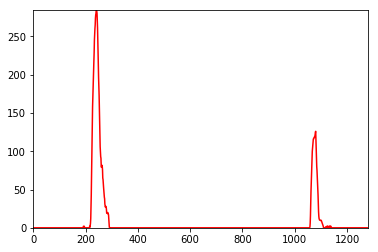

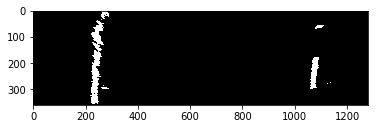

In [368]:
# Load a test image
input_img = mpimg.imread("test_images/test5.jpg")

# Undistorted image 
undist_img = undistort_image(input_img)
        
# Apply color and gradient thresholding
combined_binary = color_gradient_thres(undist_img)

# Apply perspective transform
birds_eye_threshold, _ = perspective_transform(combined_binary)
    
# Take the bottom half of the image, since Lane lines are
# likely to be mostly vertical nearest to the car
bottom_half = birds_eye_threshold[birds_eye_threshold.shape[0]//2:,:]

# i.e. the highest areas of vertical lines should be larger values
histogram =  np.sum(bottom_half, axis=0)

# Visualize the resulting histogram
plt.xlim([0, bottom_half.shape[1]])
plt.ylim([0, max(histogram)])
plt.plot(histogram, color = 'red')
plt.figure()
show_image(bottom_half)


The following function implements a slinding windows approach in which the histogram is used in each window to detect the lane lines.

In [413]:
def find_lanes_sliding_windows(binary_warped, debug_windows = False):

    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    
    # Create output images to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))

    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        if debug_windows == True:
            # Draw the windows on the visualization image
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),
            (win_xleft_high,win_y_high),(0,255,0), 2) 
            cv2.rectangle(out_img,(win_xright_low,win_y_low),
            (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    if len(leftx) and len(lefty) and len(rightx) and len(righty):
        # Fit a second order polynomial to each using `np.polyfit`
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
    else:
        left_fit = lane.prev_left_fit
        right_fit = lane.prev_right_fit

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    if len(leftx) and len(lefty) and len(rightx) and len(righty):
        # Fit a second order polynomial for the real curvature radius
        left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
        right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    else:
        left_fit_cr = lane.prev_left_fit_cr  
        right_fit_cr = lane.prev_right_fit_cr
    
    ## Visualization ##
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [255, 0, 0]

    return out_img, ploty, left_fitx, right_fitx, left_fit, right_fit, left_fit_cr, right_fit_cr

def draw_fit_lines(img, ploty, left_fitx, right_fitx):
    # Draw the left and right polynomials on the lane lines
    left_pts = np.vstack((left_fitx,ploty)).astype(np.int32).T
    right_pts = np.vstack((right_fitx,ploty)).astype(np.int32).T
    cv2.polylines(img,  [left_pts],  False,  (0, 255, 0),  10)
    cv2.polylines(img,  [right_pts],  False,  (0, 255, 0),  10)
    
    return img

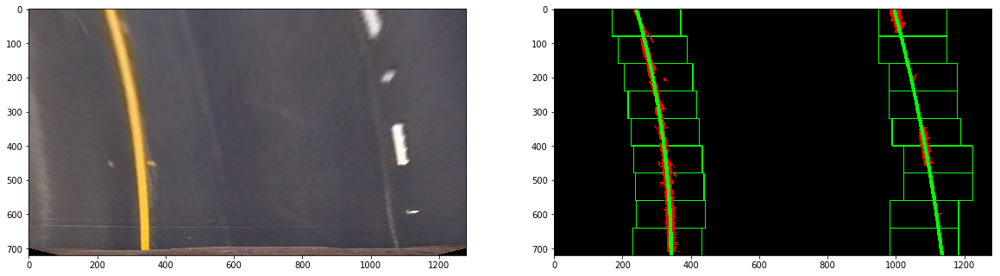

In [414]:
# Test sliding windows lane lines detection
input_img = mpimg.imread("test_images/test2.jpg");

# Undistorted image 
undist_img = undistort_image(input_img)
        
# Apply color and gradient thresholding
combined_binary = color_gradient_thres(undist_img)

# Apply perspective transform
warped_input_img, _ = perspective_transform(input_img)
warped_threshold_img, _ = perspective_transform(combined_binary)
    
# Find lane lines
lane_img, ploty, left_fitx, right_fitx, prev_left_fit, prev_right_fit, _, _ =  find_lanes_sliding_windows(warped_threshold_img, debug_windows = True)
lane_fit_img = draw_fit_lines(lane_img, ploty, left_fitx, right_fitx)

# Show images along the measurements
show_images_side_by_side(warped_input_img, lane_fit_img)

The previous function implements the lane lines detection using an sliding window approach. However, once we have the estimation of both lane lines for a given frame, it is possible to exploit the fact that the estimation is similar between consecutive frames. This enables the implementation of a more effecient lane estimation approach, which focuses of a narrow area around the lane lines detected in previous frames to avoid performing the sliding window approach for every frame from scratch 

In [415]:
def find_lanes_previous_fit(binary_warped, left_fit_prev, right_fit_prev, debug_window = False):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    # The quiz grader expects 100 here, but feel free to tune on your own!
    margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Area of search based on activated x-values within
    # the +/- margin of the previous polynomial estimation
    left_lane_inds = ((nonzerox > (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + 
                    left_fit_prev[2] - margin)) & (nonzerox < (left_fit_prev[0]*(nonzeroy**2) + 
                    left_fit_prev[1]*nonzeroy + left_fit_prev[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + 
                    right_fit_prev[2] - margin)) & (nonzerox < (right_fit_prev[0]*(nonzeroy**2) + 
                    right_fit_prev[1]*nonzeroy + right_fit_prev[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    if len(leftx) and len(lefty) and len(rightx) and len(righty):
        # Fit a second order polynomial to each using `np.polyfit`
        left_fit_new = np.polyfit(lefty, leftx, 2)
        right_fit_new = np.polyfit(righty, rightx, 2)
    else:
        left_fit_new = lane.prev_left_fit
        right_fit_new = lane.prev_right_fit
    
    # Fit new polynomials
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit_new[0]*ploty**2 + left_fit_new[1]*ploty + left_fit_new[2]
    right_fitx = right_fit_new[0]*ploty**2 + right_fit_new[1]*ploty + right_fit_new[2]

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    if len(leftx) and len(lefty) and len(rightx) and len(righty):
        # Fit a second order polynomial for the real curvature radius
        left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
        right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    else:
        left_fit_cr = lane.prev_left_fit_cr  
        right_fit_cr = lane.prev_right_fit_cr

    ## Visualization ##
    
    # Create output images to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    window_img = np.zeros_like(out_img)

    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [255, 0, 0]

    if debug_window == True:
        # Generate a polygon to illustrate the search window area
        # And recast the x and y points into usable format for cv2.fillPoly()
        left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
        left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
        left_line_pts = np.hstack((left_line_window1, left_line_window2))
        right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
        right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
        right_line_pts = np.hstack((right_line_window1, right_line_window2))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
        cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
        out_img = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)

    return out_img, ploty, left_fitx, right_fitx, left_fit_new, right_fit_new, left_fit_cr, right_fit_cr

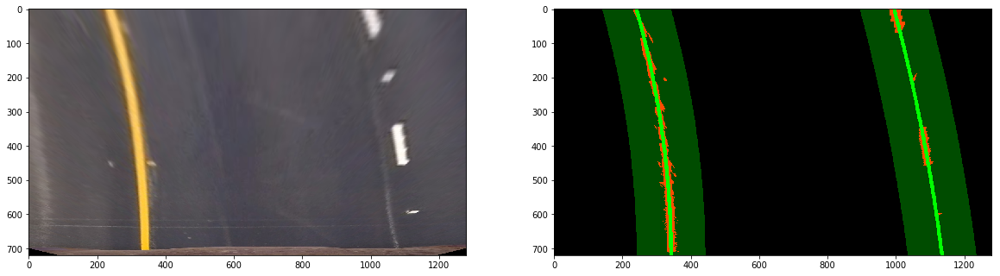

In [416]:
# Previous fit test
input_img = mpimg.imread("test_images/test2.jpg");

# Undistorted image 
undist_img = undistort_image(input_img)
        
# Apply color and gradient thresholding
combined_binary = color_gradient_thres(undist_img)

# Apply perspective transform
warped_input_img, _ = perspective_transform(input_img)
warped_threshold_img, _ = perspective_transform(combined_binary)
    
# Find lane lines
lane_img, ploty, left_fitx, right_fitx, _, _, _, _ =  find_lanes_previous_fit(warped_threshold_img, prev_left_fit, prev_right_fit, debug_window = True)
lane_fit_img = draw_fit_lines(lane_img, ploty, left_fitx, right_fitx)
    
# Show images along the measurements
show_images_side_by_side(warped_input_img, lane_img)

### 6. Curvature of the lane and vehicle position with respect to center

In [373]:
def calc_lane_curvature(ploty, left_fit_cr, right_fit_cr):
    """
    The input arguments ploty, left_fit_cr and right_fit_cr
    are generated in the find_lane_lines function
    
    Note: The final results are rounded to 2 decimals
    """
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # The maximum y-value corresponds to the bottom of the image
    y_eval = np.max(ploty)
    
    # Compute the left and right curvature radius
    left_curve_rad = round(((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0]), 2)
    right_curve_rad = round(((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0]), 2)
    
    return left_curve_rad, right_curve_rad

def calc_lane_offset(img, ploty, left_fitx, right_fitx):
    """
    The input arguments ploty, left_fitx and right_fitx
    are generated in the find_lane_lines function
    
    Note: The final results are rounded to 2 decimals
    """
        
    # The maximum y-value corresponds to the bottom of the image
    y_eval = int(np.max(ploty))
    
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # First the middle of the lane is estimated and then
    # compared with the middle point of the camera
    mid_lane = (left_fitx[y_eval] + right_fitx[y_eval])/2
    mid_camera = img.shape[1]/2
    offset = round(((mid_camera - mid_lane) * xm_per_pix), 2)
    
    return offset    

test_images/test6.jpg  | Left curvature =  917.98 m, Right curvature =  859.61 m, Lane offset =  -0.39 m


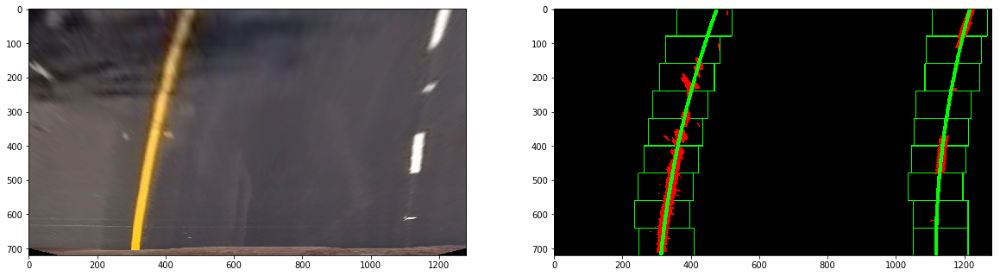

test_images/straight_lines2.jpg  | Left curvature =  18560.36 m, Right curvature =  26087.29 m, Lane offset =  -0.1 m


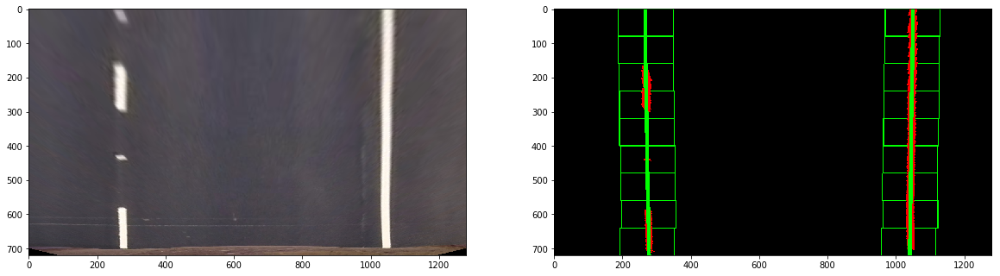

test_images/test1.jpg  | Left curvature =  471.95 m, Right curvature =  1691.96 m, Lane offset =  -0.29 m


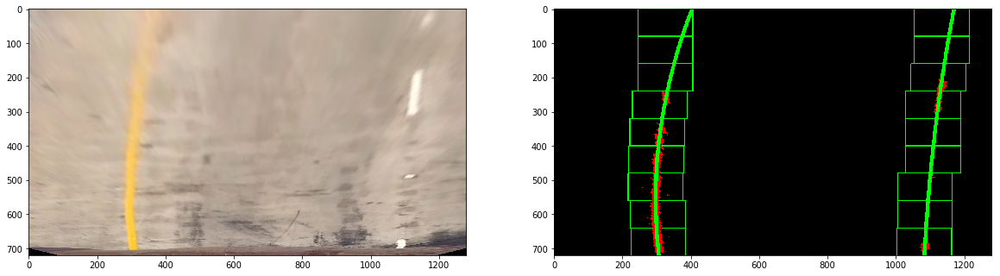

test_images/test2.jpg  | Left curvature =  865.68 m, Right curvature =  1718.67 m, Lane offset =  -0.52 m


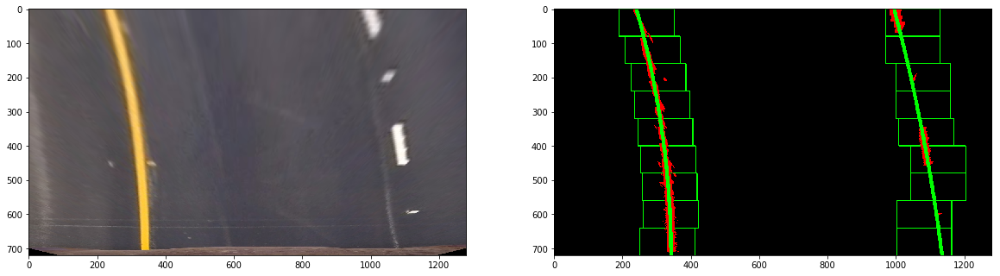

test_images/straight_lines1.jpg  | Left curvature =  1177.28 m, Right curvature =  27773.74 m, Lane offset =  -0.06 m


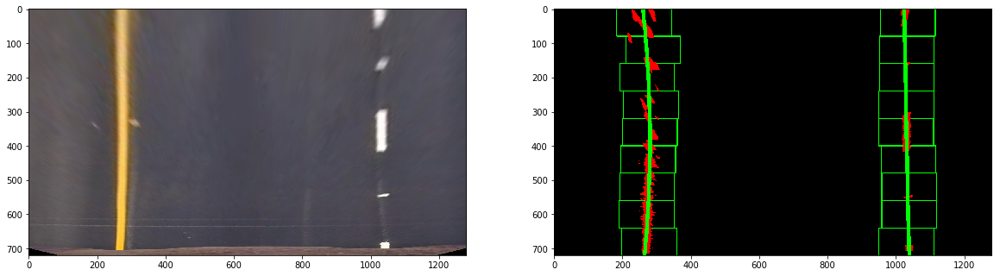

test_images/test3.jpg  | Left curvature =  970.61 m, Right curvature =  1099.51 m, Lane offset =  -0.22 m


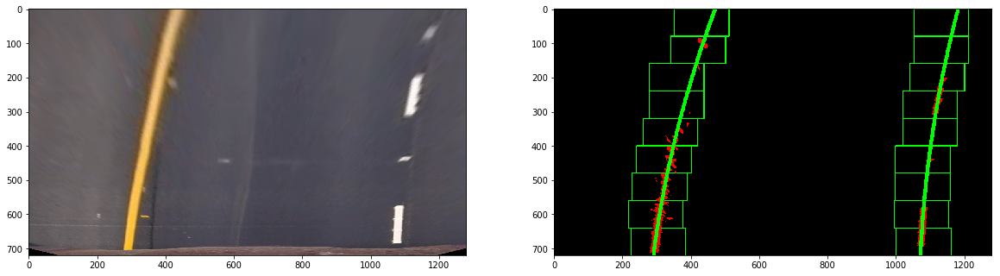

test_images/test5.jpg  | Left curvature =  1696.23 m, Right curvature =  1670.05 m, Lane offset =  -0.06 m


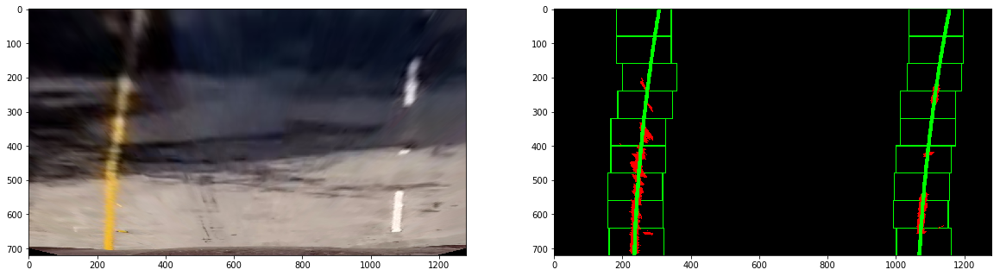

test_images/test4.jpg  | Left curvature =  6532.11 m, Right curvature =  582.35 m, Lane offset =  -0.43 m


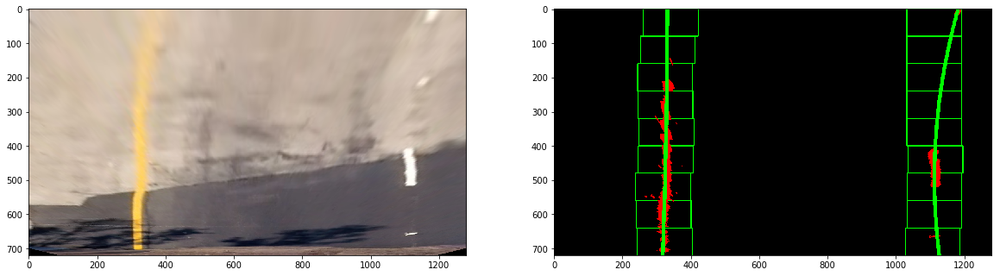

In [374]:
# Iterate over all raw test images
images = glob.glob("test_images/*.jpg")
for image_path in images:
    input_img = mpimg.imread(image_path);

    # Undistorted image 
    undist_img = undistort_image(input_img)
        
    # Apply color and gradient thresholding
    combined_binary = color_gradient_thres(undist_img)

    # Apply perspective transform
    warped_input_img, _ = perspective_transform(input_img)
    warped_threshold_img, _ = perspective_transform(combined_binary)
    
    # Find lane lines
    lane_img, ploty, left_fitx, right_fitx, _, _, left_fit_cr, right_fit_cr =  find_lanes_sliding_windows(warped_threshold_img, debug_windows = True)
    lane_fit_img = draw_fit_lines(lane_img, ploty, left_fitx, right_fitx)

    # Calculate curvature and offset
    left_curve_rad, right_curve_rad = calc_lane_curvature(ploty, left_fit_cr, right_fit_cr)
    lane_offset = calc_lane_offset(input_img, ploty, left_fitx, right_fitx)

    # Show images along the measurements
    print(image_path, " | Left curvature = ", left_curve_rad, "m, Right curvature = ", right_curve_rad, "m, Lane offset = ", lane_offset, "m")
    show_images_side_by_side(warped_input_img, lane_fit_img)


### 7. Display Lane and Information on the Original Image

In [351]:
def display_lane_and_info(undist_img, warped_input_img, warped_binary_img, warped_lane_img, ploty, left_fitx, right_fitx,
                          Minv, left_curve_rad, right_curve_rad, lane_offset):
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped_binary_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (undist_img.shape[1], undist_img.shape[0])) 

    # Combine the result with the original image
    result = cv2.addWeighted(undist_img, 1, newwarp, 0.3, 0)
    
    width = result.shape[1]
    height = result.shape[0]
    picture_ratio = 0.2
    picture_h, picture_w = int(picture_ratio * height), int(picture_ratio * width)
    off = 20
    
    # Add a small picture of the birds eye view of the lane
    small_warped_input = cv2.resize(warped_input_img, dsize=(picture_w, picture_h))
    result[off:picture_h+off, off:off+picture_w, :] = small_warped_input
    
    # Add a small picture of the birds eye view of the lane
    small_warped_lane = cv2.resize(warped_lane_img, dsize=(picture_w, picture_h))
    result[off:picture_h+off, 2*off+picture_w:2*(off+picture_w), :] = small_warped_lane
    
    # Add text with the curvature and lane offset information
    font = cv2.FONT_HERSHEY_DUPLEX    
    left_radius_text = "Left Radius = {:.2f} m".format(left_curve_rad)
    cv2.putText(result, left_radius_text, (3*off+2*picture_w, 3*off), font, 1, (255,255,255), 2)
    right_radius_text = "Right Radius = {:.2f} m".format(right_curve_rad)
    cv2.putText(result, right_radius_text, (3*off+2*picture_w, 5*off), font, 1, (255,255,255), 2)
    lane_offset_text = "Lane Offset = {:.2f} m".format(abs(lane_offset))
    if lane_offset < 0:
        lane_offset_text += " to the left"
    else:
        lane_offset_text += " to the right"
    cv2.putText(result, lane_offset_text, (3*off+2*picture_w, 7*off), font, 1, (255,255,255), 2)
    
    return result

### 8. Complete Lane Detection Pipeline

Having developed all pieces for a more robust pipeline for lane detection, now it is possible to put everything together as a single pipeline to process each image. However, first a Lane object is going to be defined to keep track of the detected lane lines across frames.

In [402]:
# Class the keep track of characteristics of the lane across multiple frames
class Lane():
    def __init__(self):
        # Was the lane detected in the last frame?
        self.detected = False  
        # Average distance between lines
        self.av_dist = None
        # Previous fit information
        self.prev_left_fit = None 
        self.prev_right_fit = None
        self.ploty = []
        self.prev_left_fitx = [] 
        self.prev_right_fitx = []
        self.prev_left_fit_cr = None 
        self.prev_right_fit_cr = None
        
    def add_av_dist(self, av_dist):
        self.av_dist = av_dist
            
    def add_prev_fit(self, left_fit, right_fit, ploty, left_fitx, right_fitx, left_fit_cr, right_fit_cr):
        self.prev_left_fit = left_fit
        self.prev_right_fit = right_fit
        self.prev_ploty = ploty  
        self.prev_left_fitx = left_fitx
        self.prev_right_fitx = right_fitx
        self.prev_left_fit_cr = left_fit_cr 
        self.prev_right_fit_cr = right_fit_cr


In [403]:
def line_av_distance(left_fitx, right_fitx):
    dist = right_fitx - left_fitx
    av_dist = np.average(dist)
    max_dist = np.max(dist)
    min_dist = np.min(dist)

    return av_dist, max_dist, min_dist

In [430]:
def lane_detection_pipeline(img, force_sliding_windows = False):
    # Undistorted image 
    undist_img = undistort_image(img)
        
    # Apply color and gradient thresholding
    combined_binary = color_gradient_thres(undist_img)
    
    # Apply perspective transform
    warped_input_img, _ = perspective_transform(img)
    warped_binary_img, Minv = perspective_transform(combined_binary)
    
    # Find lane lines
    if force_sliding_windows is True or lane.detected is False:
        lane_img, ploty, left_fitx, right_fitx, left_fit, right_fit, left_fit_cr, right_fit_cr =  find_lanes_sliding_windows(warped_binary_img, debug_windows = False)
    else:
        lane_img, ploty, left_fitx, right_fitx, left_fit, right_fit, left_fit_cr, right_fit_cr =  find_lanes_previous_fit(warped_binary_img, lane.prev_left_fit, lane.prev_right_fit)
        
    # Verify average distance between lines
    av_dist, max_dist, min_dist = line_av_distance(left_fitx, right_fitx)

    # Detect bad frames by checking the minimum distance between
    # lines with the average distance along the previous frames
    # The tolerance metric here is +- 30% of the average lane width
    bad_frame = False
    if force_sliding_windows is False:
        if len(ploty) and (lane.av_dist is None or (min_dist > (0.80 * lane.av_dist) and max_dist < (1.20 * lane.av_dist))):
            lane.add_av_dist(av_dist)
            lane.detected = True
            lane.add_prev_fit(left_fit, right_fit, ploty, left_fitx, right_fitx, left_fit_cr, right_fit_cr)
        else:
            # Bad frame identified
            print("bad frame")
            lane.detected = False
            bad_frame = True

    if bad_frame is False:
        # Draw fit lane lines
        lane_fit_img = draw_fit_lines(lane_img, ploty, left_fitx, right_fitx)
        
        # Calculate curvature and offset
        left_curve_rad, right_curve_rad = calc_lane_curvature(ploty, left_fit_cr, right_fit_cr)
        lane_offset = calc_lane_offset(input_img, ploty, left_fitx, right_fitx)
    
        # Display lane and information on the image
        output_img = display_lane_and_info(undist_img, warped_input_img, warped_binary_img, lane_fit_img, ploty,
                                       left_fitx, right_fitx, Minv, left_curve_rad, right_curve_rad, lane_offset)
    else:
        # Draw fit lane lines
        lane_fit_img = draw_fit_lines(lane_img, lane.prev_ploty, lane.prev_left_fitx, lane.prev_right_fitx)

        # Calculate curvature and offset
        left_curve_rad, right_curve_rad = calc_lane_curvature(lane.prev_ploty, lane.prev_left_fit_cr, lane.prev_right_fit_cr)
        lane_offset = calc_lane_offset(input_img, lane.prev_ploty, lane.prev_left_fitx, lane.prev_right_fitx)
    
        # Display lane and information on the image
        output_img = display_lane_and_info(undist_img, warped_input_img, warped_binary_img, lane_fit_img, lane.prev_ploty,
                                       lane.prev_left_fitx, lane.prev_right_fitx, Minv, left_curve_rad, right_curve_rad, lane_offset)

    #show_images_side_by_side3(warped_input_img, warped_binary_img, lane_fit_img)

    return output_img



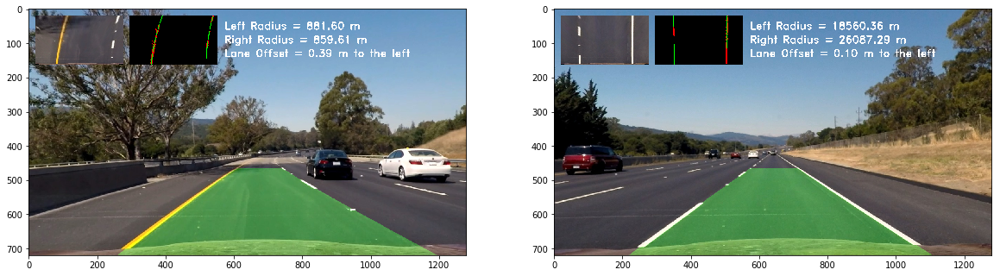

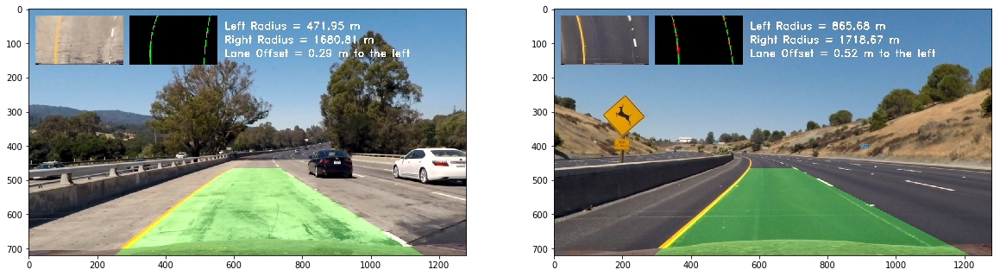

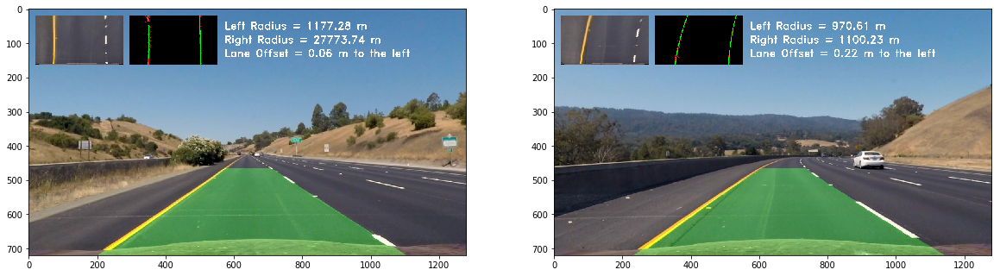

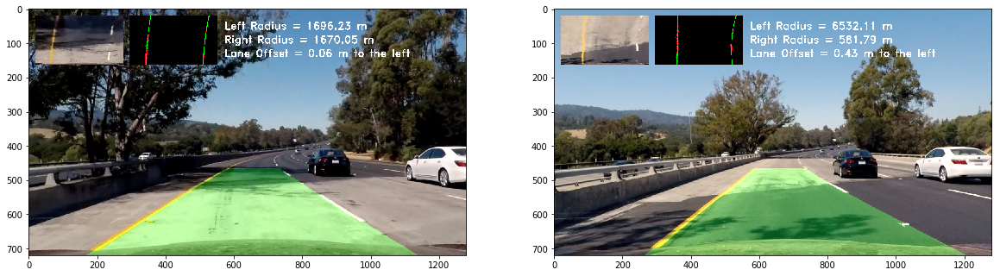

In [431]:
# Global left and right lane lines objects
lane = Lane()
    
# Iterate over all raw test images
images = glob.glob("test_images/*.jpg")
output_imgs = []
for image_path in images:
    input_img = mpimg.imread(image_path);
    output_img = lane_detection_pipeline(input_img, force_sliding_windows = True)
    output_imgs.append(output_img)
    
show_images_side_by_side(output_imgs[0], output_imgs[1])
show_images_side_by_side(output_imgs[2], output_imgs[3])
show_images_side_by_side(output_imgs[4], output_imgs[5])
show_images_side_by_side(output_imgs[6], output_imgs[7])

### 9. Apply the Lane Detection Pipeline to the Project Video

In [432]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

# Global left and right lane lines objects
lane = Lane()

project_output = 'output_videos/project_output.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("project_video.mp4").subclip(0,5)
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(lane_detection_pipeline) #NOTE: this function expects color images!!
%time white_clip.write_videofile(project_output, audio=False)

[MoviePy] >>>> Building video output_videos/project_output.mp4
[MoviePy] Writing video output_videos/project_output.mp4



 12%|█▏        | 152/1261 [01:41<12:35,  1.47it/s]


 24%|██▍       | 303/1261 [03:26<10:50,  1.47it/s]


 36%|███▌      | 454/1261 [05:10<09:27,  1.42it/s]


 45%|████▌     | 572/1261 [06:32<08:09,  1.41it/s]

bad frame



 57%|█████▋    | 723/1261 [08:19<06:19,  1.42it/s]


 69%|██████▉   | 874/1261 [10:03<04:22,  1.48it/s]


 79%|███████▉  | 994/1261 [11:26<03:05,  1.44it/s]

bad frame



 91%|█████████ | 1142/1261 [13:12<01:22,  1.44it/s]


100%|█████████▉| 1260/1261 [14:34<00:00,  1.44it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos/project_output.mp4 

CPU times: user 11min 33s, sys: 45.3 s, total: 12min 18s
Wall time: 14min 37s


Play the video inline

In [435]:
HTML("""6
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_output))

### 10. Apply Lane Detection Pipeline to Challenge Video

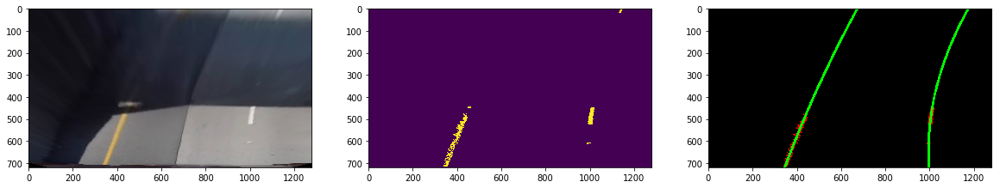

[MoviePy] >>>> Building video output_videos/challenge_output.mp4
[MoviePy] Writing video output_videos/challenge_output.mp4



  0%|          | 0/60 [00:00<?, ?it/s]

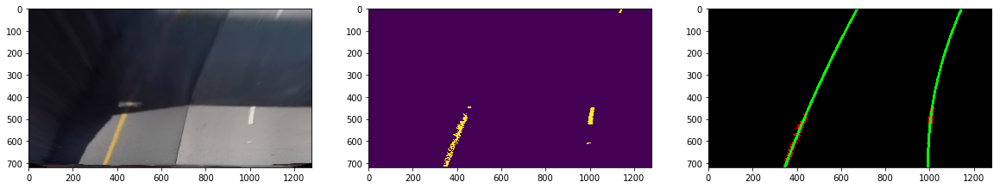


  2%|▏         | 1/60 [00:01<01:32,  1.57s/it]

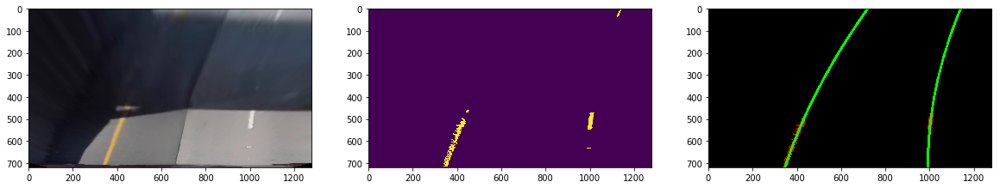


  3%|▎         | 2/60 [00:02<01:28,  1.53s/it]

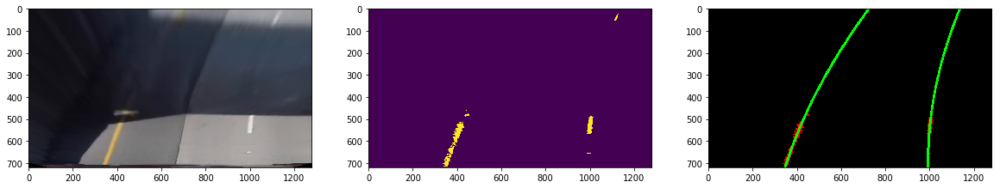


  5%|▌         | 3/60 [00:04<01:25,  1.50s/it]

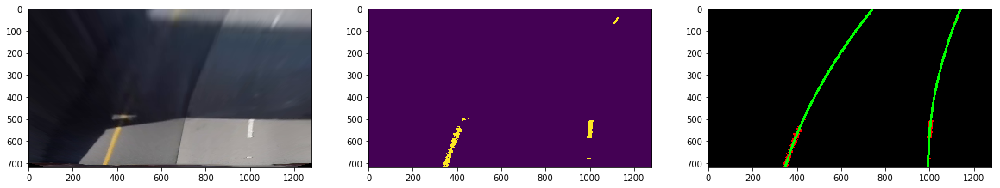


  7%|▋         | 4/60 [00:05<01:22,  1.48s/it]

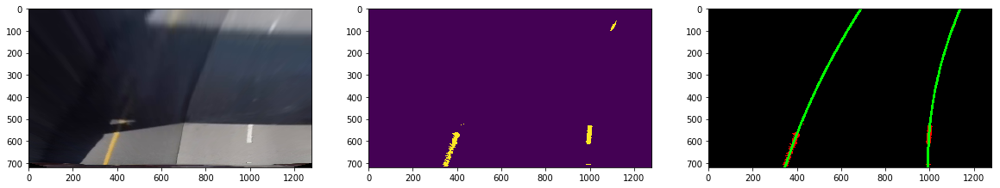


  8%|▊         | 5/60 [00:07<01:20,  1.46s/it]

bad frame


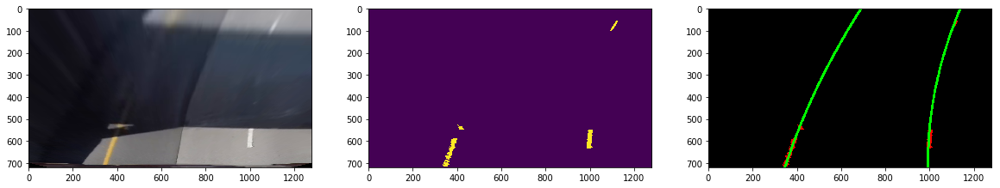


 10%|█         | 6/60 [00:08<01:20,  1.49s/it]

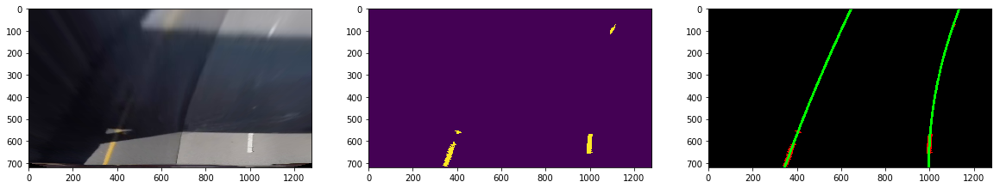


 12%|█▏        | 7/60 [00:10<01:18,  1.47s/it]

bad frame


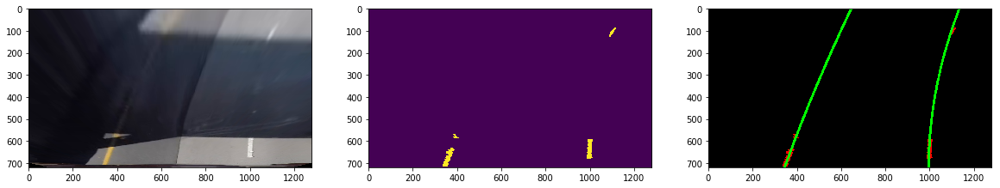


 13%|█▎        | 8/60 [00:11<01:16,  1.47s/it]

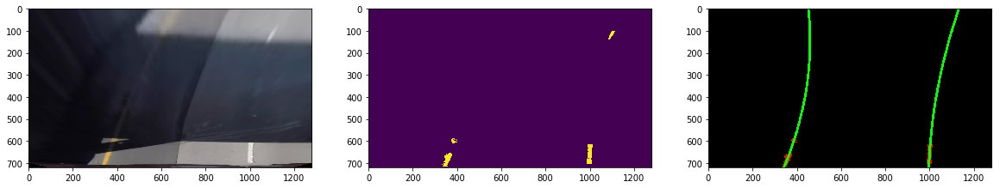


 15%|█▌        | 9/60 [00:13<01:14,  1.46s/it]

bad frame


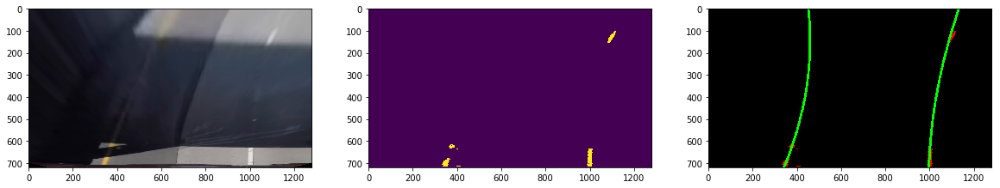


 17%|█▋        | 10/60 [00:14<01:12,  1.45s/it]

bad frame


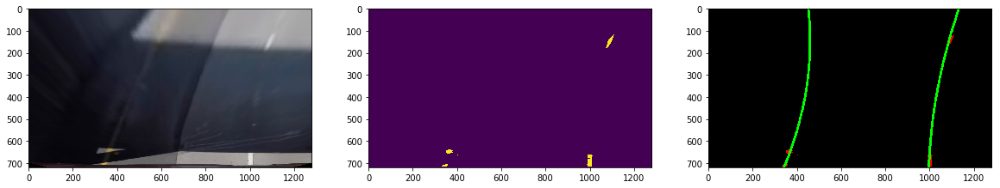


 18%|█▊        | 11/60 [00:16<01:10,  1.44s/it]

bad frame


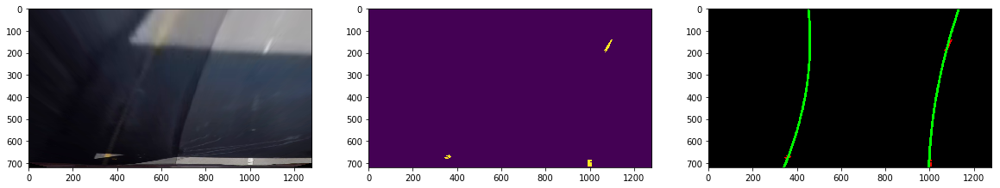


 20%|██        | 12/60 [00:17<01:10,  1.48s/it]

bad frame


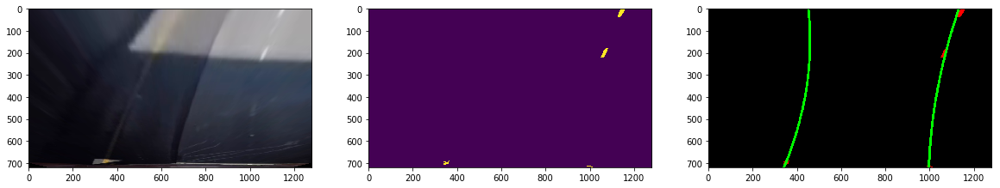


 22%|██▏       | 13/60 [00:19<01:08,  1.47s/it]

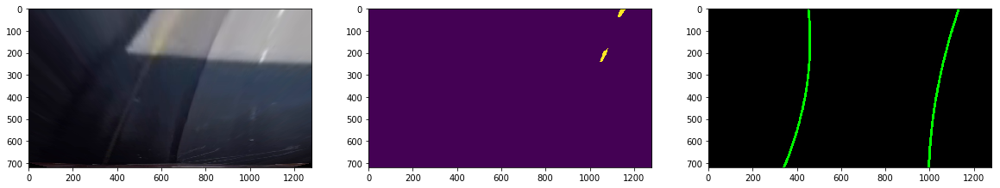


 23%|██▎       | 14/60 [00:20<01:07,  1.46s/it]

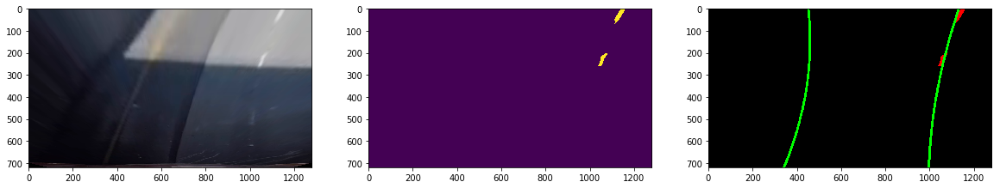


 25%|██▌       | 15/60 [00:21<01:05,  1.45s/it]

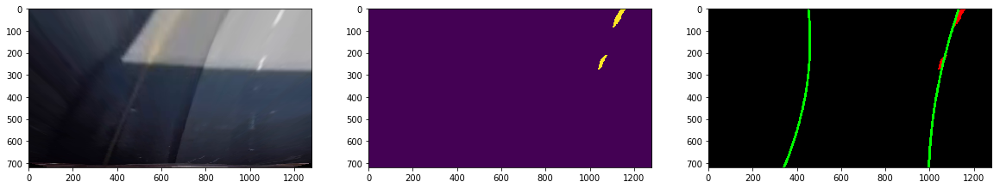


 27%|██▋       | 16/60 [00:23<01:03,  1.44s/it]

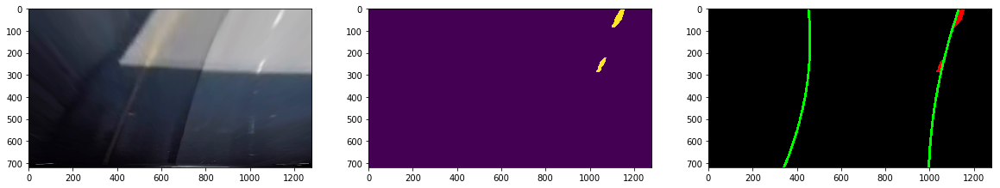


 28%|██▊       | 17/60 [00:24<01:03,  1.47s/it]

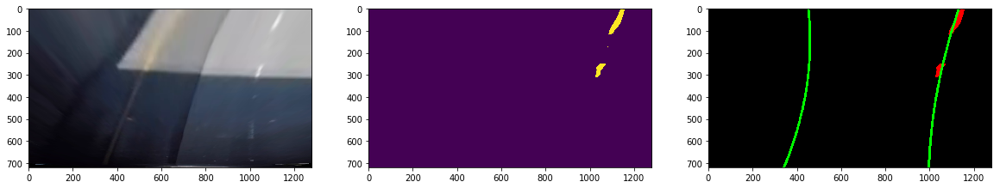


 30%|███       | 18/60 [00:26<01:01,  1.46s/it]

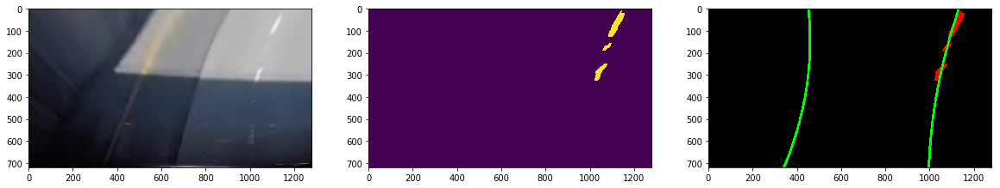


 32%|███▏      | 19/60 [00:27<00:59,  1.45s/it]

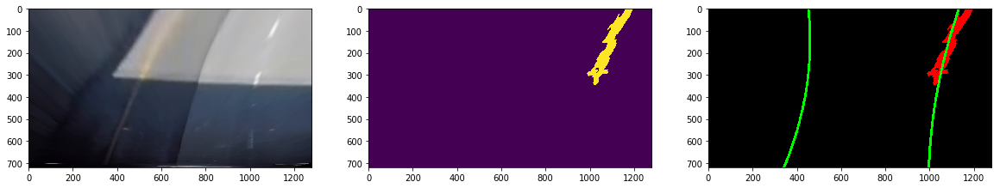


 33%|███▎      | 20/60 [00:29<00:57,  1.44s/it]

bad frame


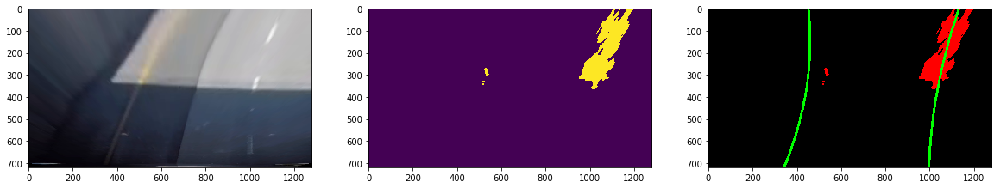


 35%|███▌      | 21/60 [00:30<00:56,  1.45s/it]

bad frame


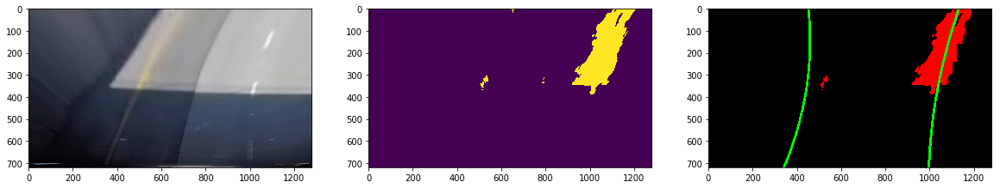


 37%|███▋      | 22/60 [00:32<00:55,  1.45s/it]

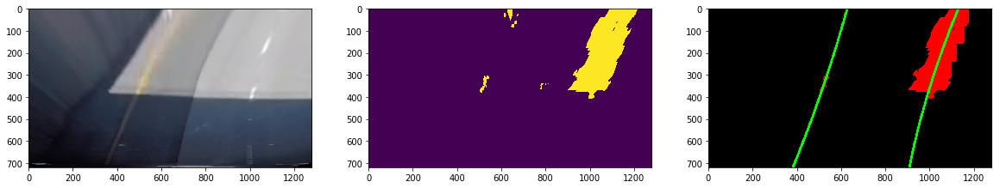


 38%|███▊      | 23/60 [00:33<00:55,  1.49s/it]

bad frame


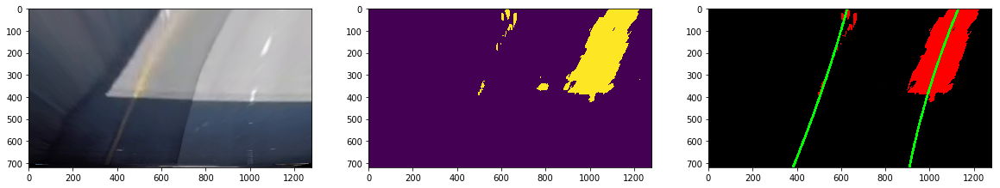


 40%|████      | 24/60 [00:35<00:53,  1.48s/it]

bad frame


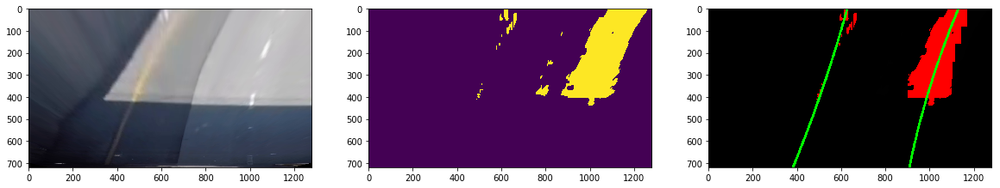


 42%|████▏     | 25/60 [00:36<00:51,  1.48s/it]

bad frame


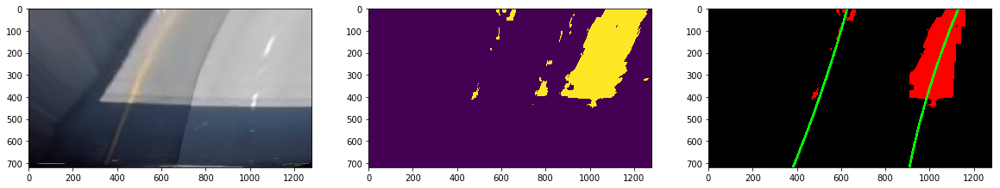


 43%|████▎     | 26/60 [00:38<00:50,  1.47s/it]

bad frame


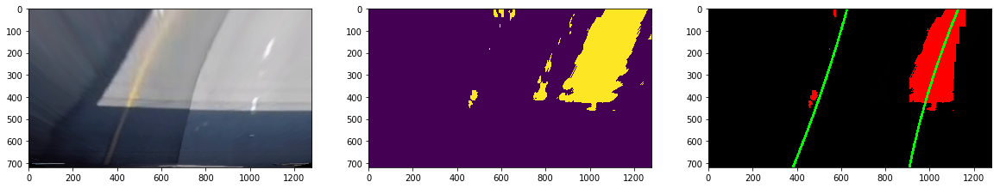


 45%|████▌     | 27/60 [00:39<00:48,  1.47s/it]

bad frame


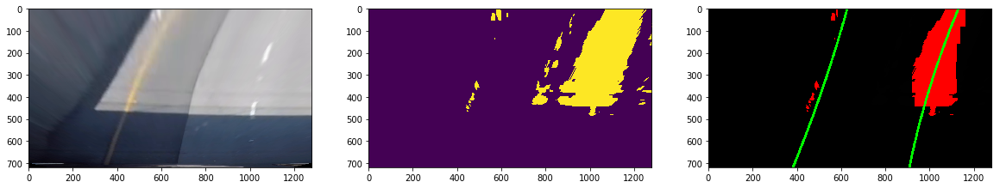


 47%|████▋     | 28/60 [00:41<00:48,  1.50s/it]

bad frame


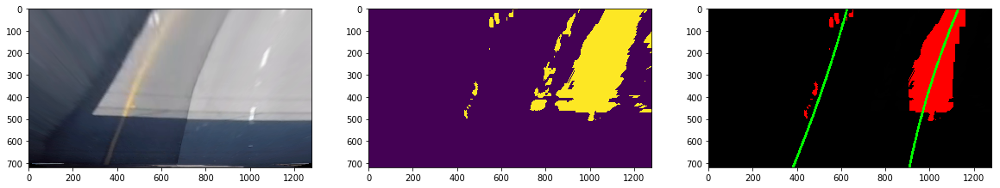


 48%|████▊     | 29/60 [00:42<00:46,  1.50s/it]

bad frame


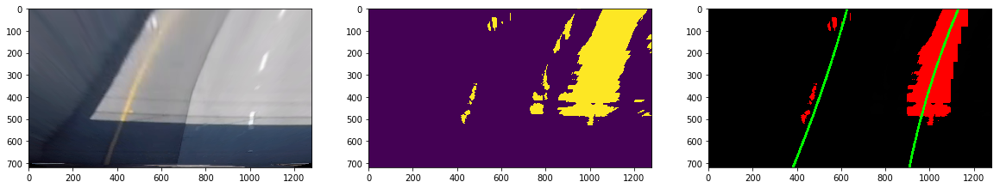


 50%|█████     | 30/60 [00:44<00:44,  1.50s/it]

bad frame


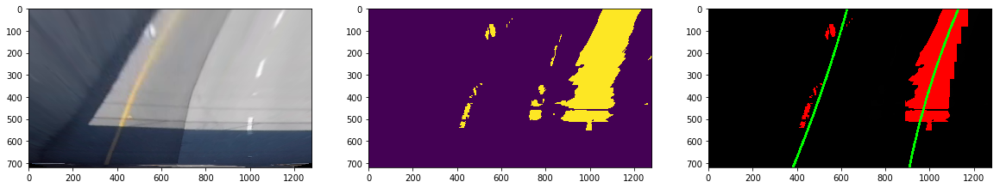


 52%|█████▏    | 31/60 [00:45<00:43,  1.49s/it]

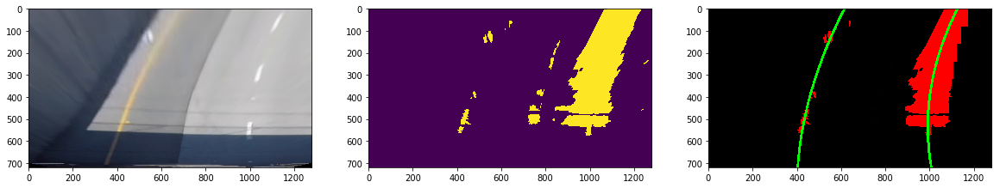


 53%|█████▎    | 32/60 [00:47<00:42,  1.50s/it]

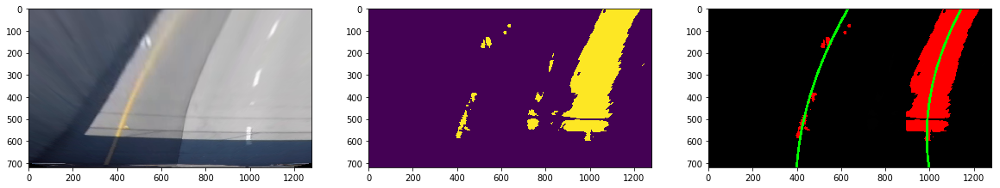


 55%|█████▌    | 33/60 [00:48<00:41,  1.52s/it]

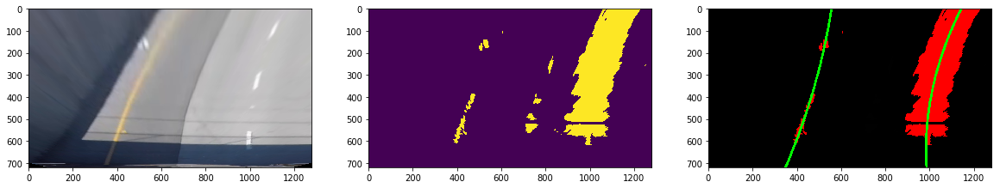


 57%|█████▋    | 34/60 [00:50<00:41,  1.58s/it]

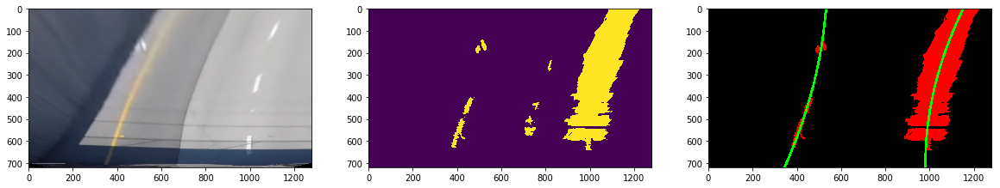


 58%|█████▊    | 35/60 [00:51<00:39,  1.57s/it]

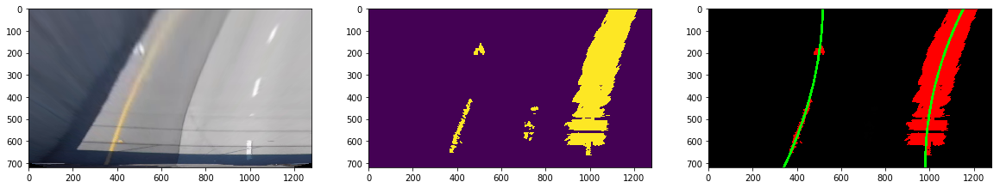


 60%|██████    | 36/60 [00:53<00:36,  1.54s/it]

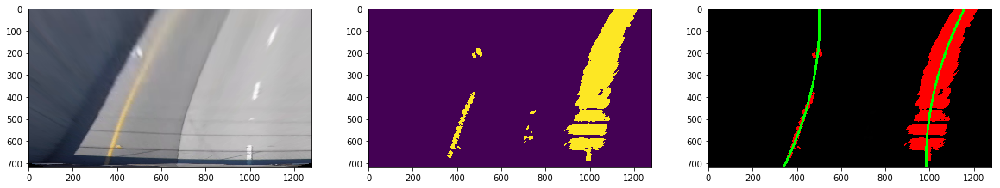


 62%|██████▏   | 37/60 [00:54<00:34,  1.51s/it]

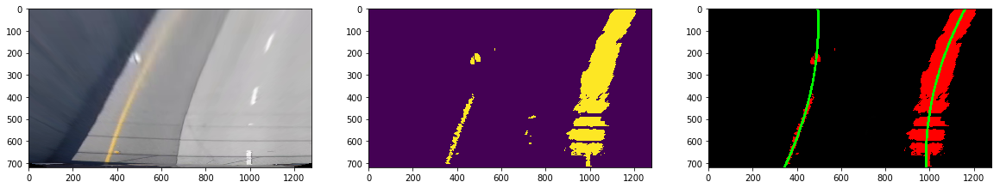


 63%|██████▎   | 38/60 [00:56<00:32,  1.49s/it]

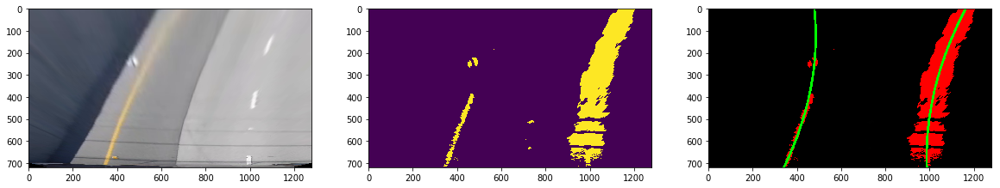


 65%|██████▌   | 39/60 [00:57<00:31,  1.51s/it]

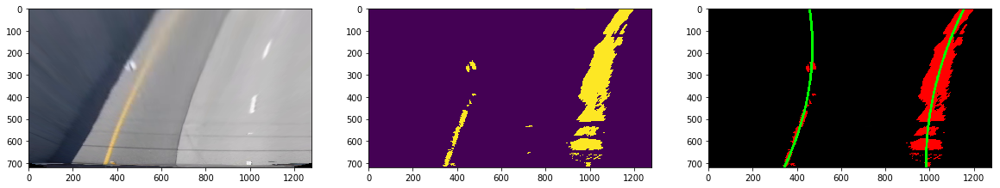


 67%|██████▋   | 40/60 [00:59<00:29,  1.49s/it]

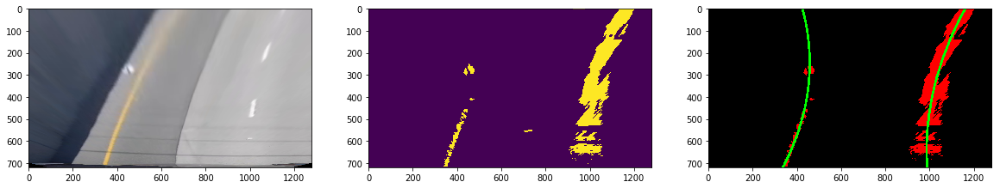


 68%|██████▊   | 41/60 [01:00<00:27,  1.47s/it]

bad frame


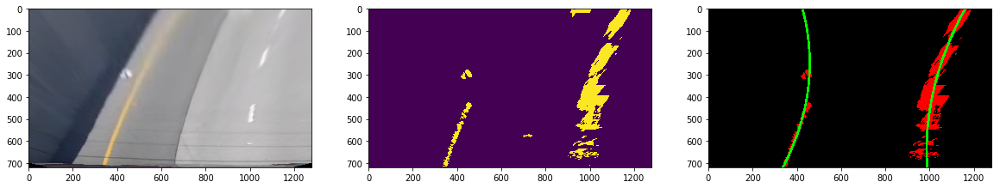


 70%|███████   | 42/60 [01:02<00:26,  1.47s/it]

bad frame


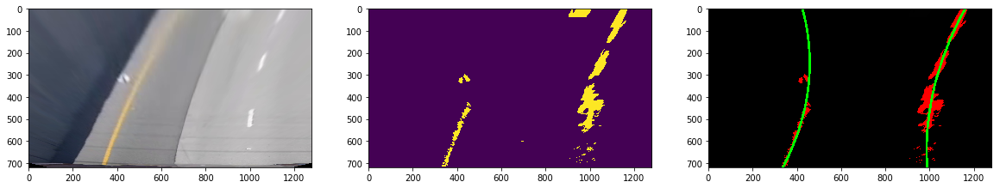


 72%|███████▏  | 43/60 [01:03<00:26,  1.55s/it]

bad frame


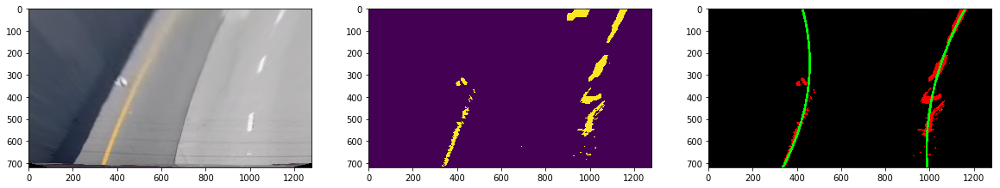


 73%|███████▎  | 44/60 [01:05<00:24,  1.54s/it]

bad frame


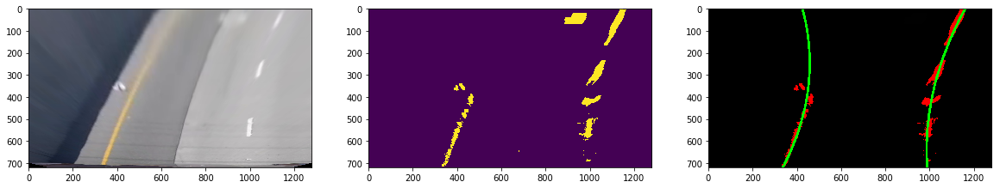


 75%|███████▌  | 45/60 [01:07<00:23,  1.59s/it]

bad frame


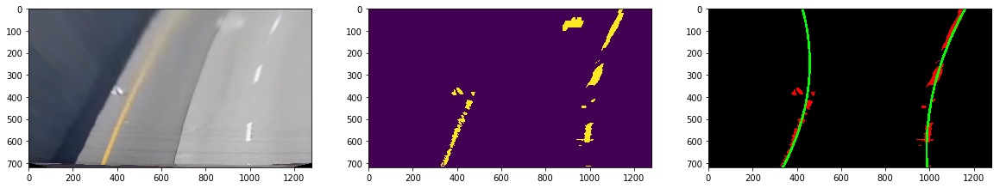


 77%|███████▋  | 46/60 [01:08<00:21,  1.57s/it]

bad frame


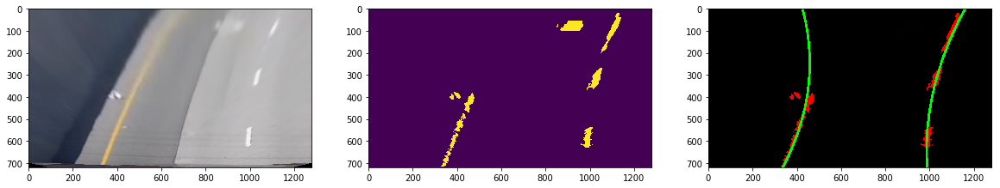


 78%|███████▊  | 47/60 [01:10<00:20,  1.56s/it]

bad frame


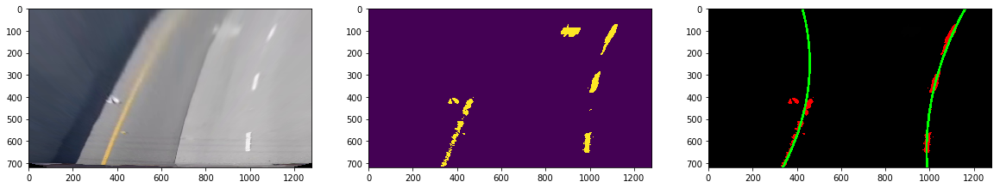


 80%|████████  | 48/60 [01:11<00:18,  1.55s/it]

bad frame


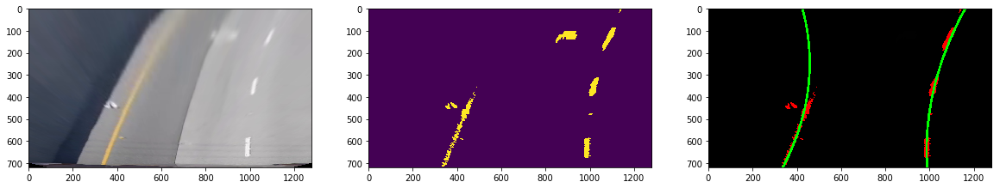


 82%|████████▏ | 49/60 [01:13<00:16,  1.54s/it]

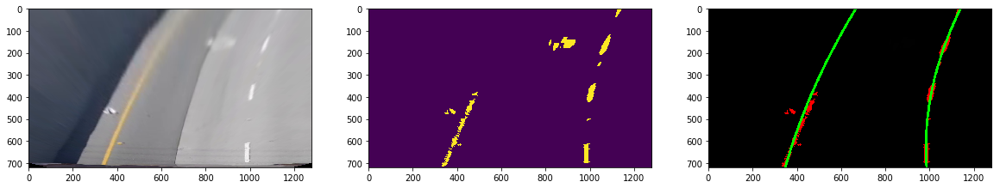


 83%|████████▎ | 50/60 [01:14<00:15,  1.57s/it]

bad frame


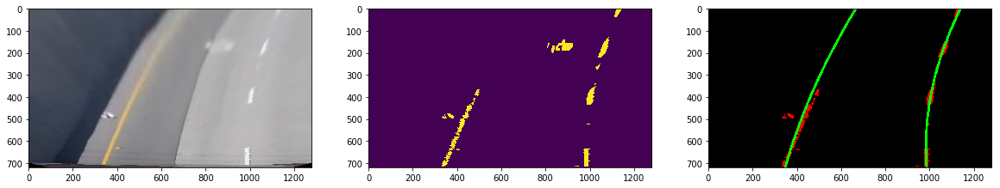


 85%|████████▌ | 51/60 [01:16<00:14,  1.56s/it]

bad frame


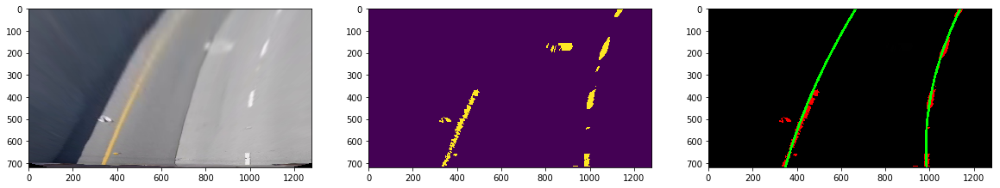


 87%|████████▋ | 52/60 [01:17<00:12,  1.55s/it]

bad frame


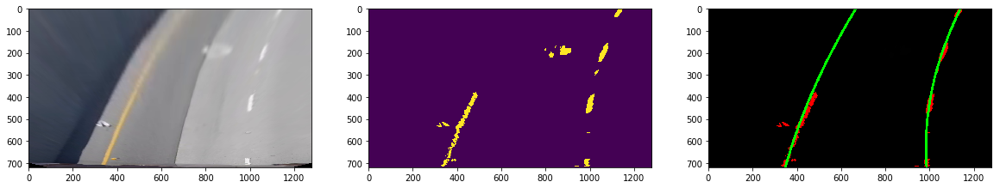


 88%|████████▊ | 53/60 [01:19<00:10,  1.54s/it]

bad frame


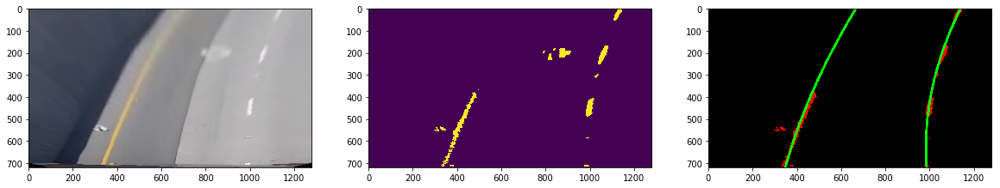


 90%|█████████ | 54/60 [01:20<00:09,  1.53s/it]

bad frame


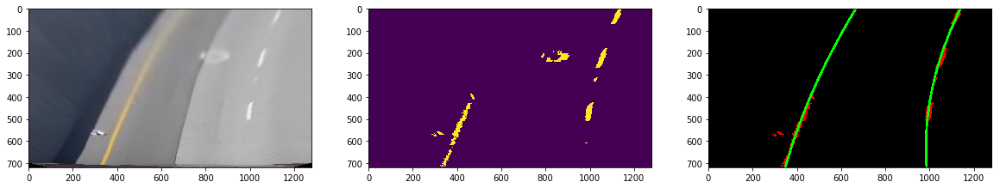


 92%|█████████▏| 55/60 [01:22<00:07,  1.53s/it]

bad frame


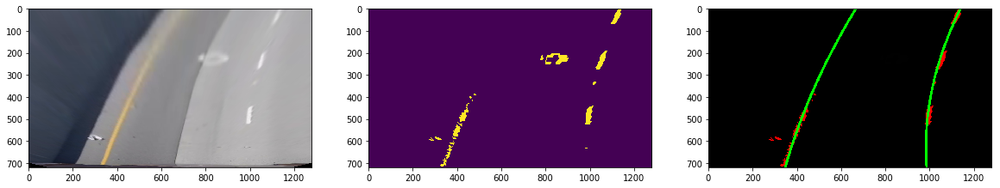


 93%|█████████▎| 56/60 [01:24<00:06,  1.57s/it]

bad frame


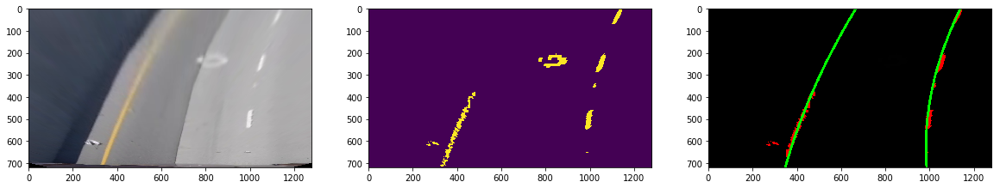


 95%|█████████▌| 57/60 [01:25<00:04,  1.56s/it]

bad frame


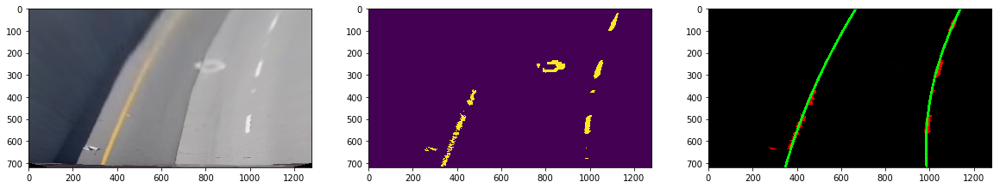


 97%|█████████▋| 58/60 [01:27<00:03,  1.55s/it]

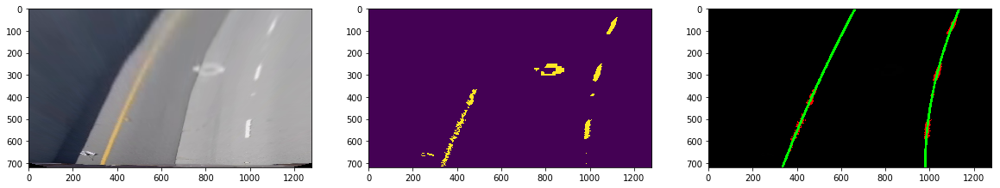


 98%|█████████▊| 59/60 [01:28<00:01,  1.54s/it]

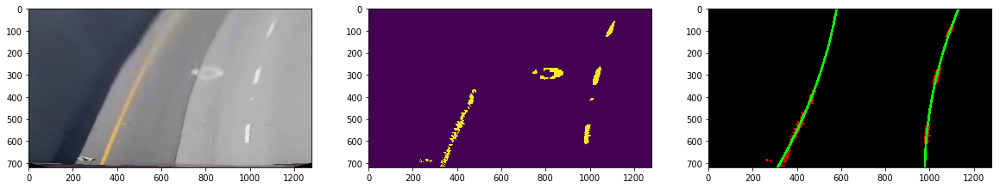


100%|██████████| 60/60 [01:30<00:00,  1.53s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos/challenge_output.mp4 

CPU times: user 1min 25s, sys: 1.24 s, total: 1min 26s
Wall time: 1min 33s


In [424]:
# Global left and right lane lines objects
lane = Lane()

challenge_output = 'output_videos/challenge_output.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("challenge_video.mp4").subclip(6,7)
clip1 = VideoFileClip("challenge_video.mp4").subclip(4,6)
white_clip = clip1.fl_image(lane_detection_pipeline) #NOTE: this function expects color images!!
%time white_clip.write_videofile(challenge_output, audio=False)

In [425]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge_output))